In [37]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [38]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score,confusion_matrix,roc_auc_score,roc_curve

In [3]:
df = pd.read_csv("https://raw.githubusercontent.com/amberkakkar01/Prediction-of-Wine-Quality/master/winequality-red.csv")

In [4]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [5]:
df['quality'].value_counts()

5    681
6    638
7    199
4     53
8     18
3     10
Name: quality, dtype: int64

In [6]:
from pandas_profiling import ProfileReport

In [7]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [9]:
X=df.iloc[:,:-1]

In [10]:
X

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [11]:
Y=df['quality']

In [12]:
x_tr,x_te,y_tr,y_te=train_test_split(X,Y,test_size=0.20,random_state=100000)

In [13]:
model=DecisionTreeClassifier()

In [14]:
model.fit(x_tr,y_tr)

DecisionTreeClassifier()

In [15]:
y_pred=model.predict(x_te)

In [16]:
confusion_matrix(y_te,y_pred)

array([[  0,   1,   1,   0,   0,   0],
       [  0,   1,   3,   3,   0,   0],
       [  2,   5,  79,  36,   7,   1],
       [  0,   2,  23, 101,   4,   0],
       [  0,   0,   6,  16,  24,   1],
       [  0,   0,   1,   2,   1,   0]], dtype=int64)

In [17]:
accuracy_score(y_te,y_pred)

0.640625

In [18]:
m2=DecisionTreeClassifier(criterion='entropy')

In [19]:
m2.fit(x_tr,y_tr)

DecisionTreeClassifier(criterion='entropy')

In [20]:
y_pred2=m2.predict(x_te)

In [21]:
accuracy_score(y_te,y_pred2)

0.596875

In [22]:
dot_file=open("m2.dot","w")

In [23]:
tree.export_graphviz(m2,out_file=dot_file,feature_names=X.columns)

In [24]:
pwd()

'C:\\Users\\Dell'

In [25]:
dir()

['DecisionTreeClassifier',
 'GridSearchCV',
 'In',
 'Out',
 'ProfileReport',
 'X',
 'Y',
 '_',
 '_10',
 '_14',
 '_16',
 '_17',
 '_19',
 '_21',
 '_24',
 '_4',
 '_5',
 '_7',
 '_8',
 '__',
 '___',
 '__builtin__',
 '__builtins__',
 '__doc__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '_dh',
 '_i',
 '_i1',
 '_i10',
 '_i11',
 '_i12',
 '_i13',
 '_i14',
 '_i15',
 '_i16',
 '_i17',
 '_i18',
 '_i19',
 '_i2',
 '_i20',
 '_i21',
 '_i22',
 '_i23',
 '_i24',
 '_i25',
 '_i3',
 '_i4',
 '_i5',
 '_i6',
 '_i7',
 '_i8',
 '_i9',
 '_ih',
 '_ii',
 '_iii',
 '_oh',
 'accuracy_score',
 'confusion_matrix',
 'df',
 'dot_file',
 'exit',
 'get_ipython',
 'm2',
 'model',
 'np',
 'pd',
 'plt',
 'quit',
 'roc_auc_score',
 'roc_curve',
 'sns',
 'train_test_split',
 'tree',
 'x_te',
 'x_tr',
 'y_pred',
 'y_pred2',
 'y_te',
 'y_tr']

In [26]:
dt_model = DecisionTreeClassifier()

In [27]:
dt_model.fit(x_tr,y_tr)

DecisionTreeClassifier()

In [31]:
import sklearn

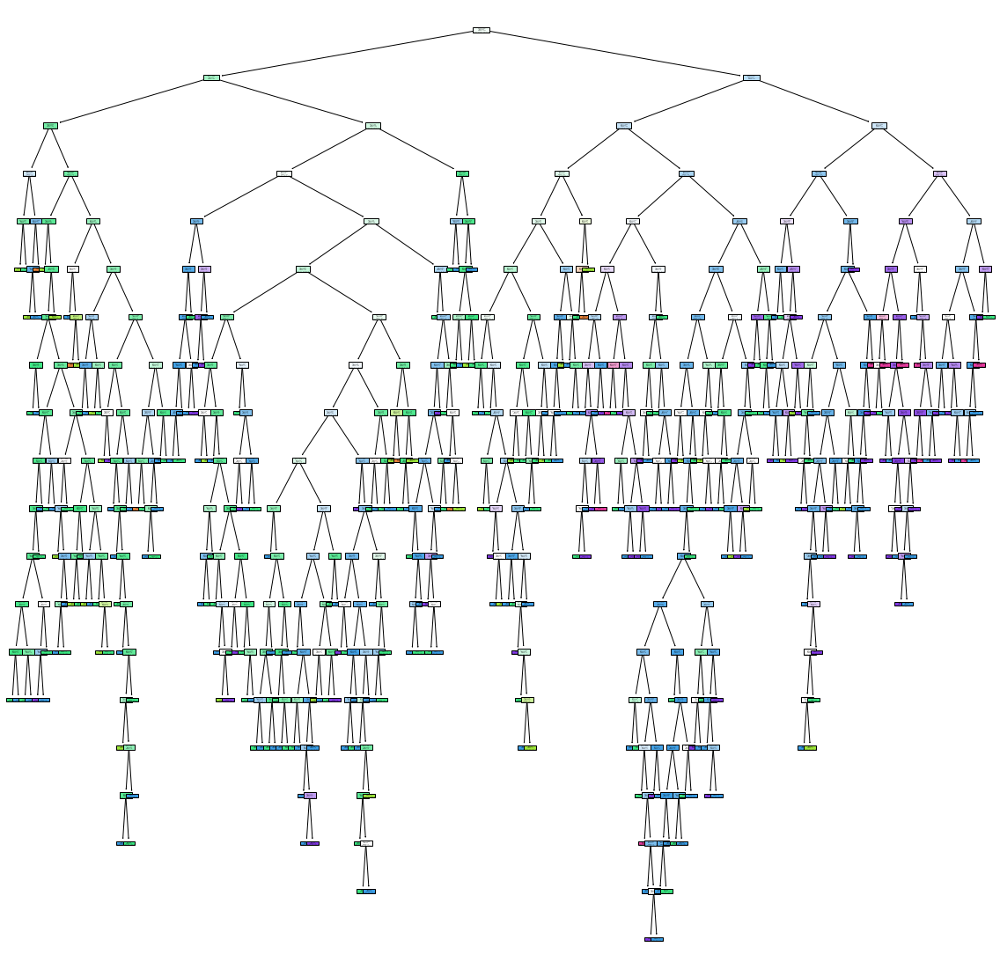

In [39]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True)
plt.show()

In [32]:
sklearn.__version__

'0.24.1'

In [35]:
pip install --upgrade sklearn

  Created wheel for sklearn: filename=sklearn-0.0-py2.py3-none-any.whl size=1316 sha256=7b2f063bdf6203d8b0f3ad5637bc86a8a5c6ef402fff1c8baf29cb00c7192bdb
  Stored in directory: c:\users\dell\appdata\local\pip\cache\wheels\22\0b\40\fd3f795caaa1fb4c6cb738bc1f56100be1e57da95849bfc897
Successfully built sklearn
Note: you may need to restart the kernel to use updated packages.


In [36]:
import sklearn

In [129]:
df1=df.head(1000)

In [130]:
x1 = df1.drop(columns='quality')
y1=df1['quality']

In [131]:
df1_model = DecisionTreeClassifier()

In [132]:
df1_model.fit(x1,y1)

DecisionTreeClassifier()

In [133]:
x1.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4


In [134]:
x1['citric acid'].v

AttributeError: 'Series' object has no attribute 'v'

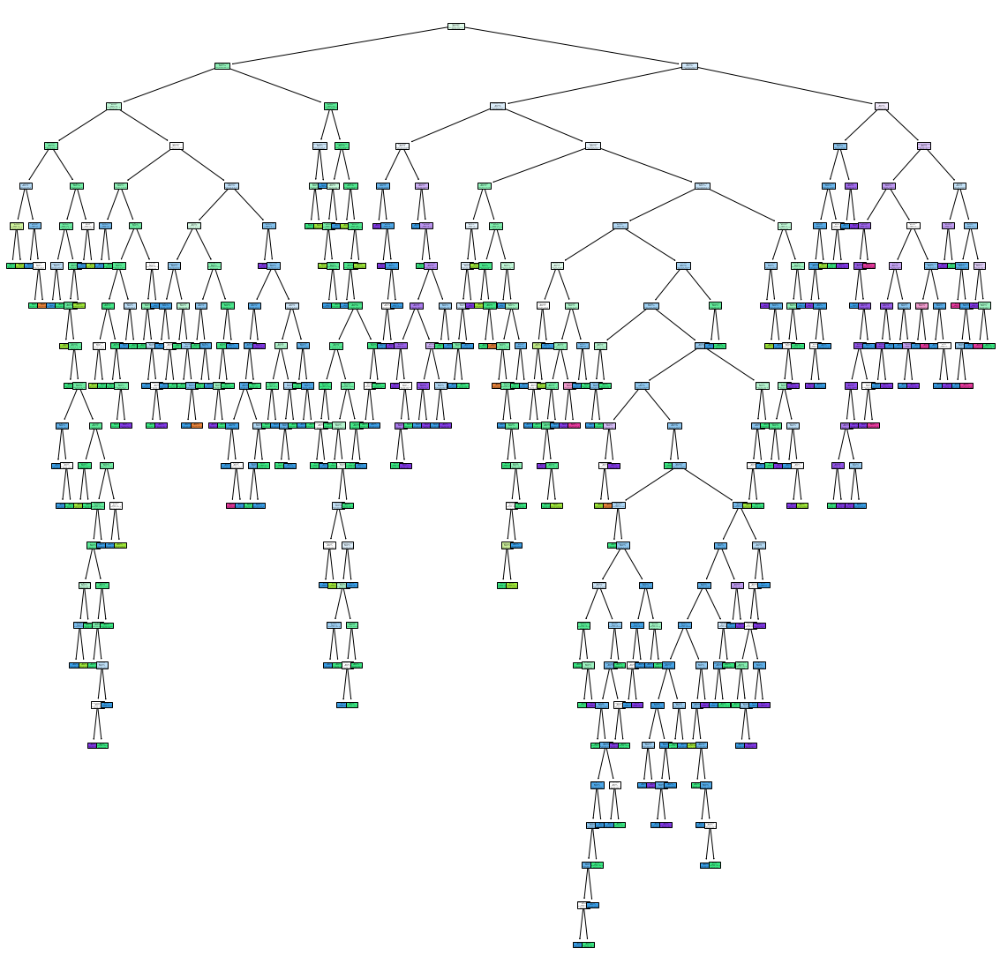

<Figure size 432x288 with 0 Axes>

In [135]:
plt.figure(figsize=(20,20))
tree.plot_tree(df1_model,filled=True,class_names=[i for i in df1.columns],feature_names=[i for i in df1.columns])
plt.show()
plt.savefig('dt_model_1')

In [136]:
y_pred=df1_model.predict(x_te)

In [137]:
df1_model.score(x1,y1)

1.0

In [138]:
accuracy_score(y_te,y_pred)

0.75625

In [139]:
df1_model.score(x_te,y_te)

0.75625

In [140]:
path=df1_model.cost_complexity_pruning_path(x1,y1)

In [141]:
path

{'ccp_alphas': array([0.        , 0.00065   , 0.0008    , 0.00083333, 0.00083333,
        0.00085714, 0.000875  , 0.00088889, 0.00092308, 0.00092857,
        0.00093198, 0.00094085, 0.00094737, 0.00094737, 0.00095455,
        0.00095455, 0.00095455, 0.00096429, 0.00097826, 0.00098387,
        0.00098485, 0.001     , 0.001     , 0.001     , 0.001     ,
        0.001     , 0.001     , 0.001     , 0.001     , 0.001     ,
        0.001     , 0.001     , 0.001075  , 0.00126667, 0.00133333,
        0.00133333, 0.00133333, 0.00133333, 0.00133333, 0.00133333,
        0.00133333, 0.00133333, 0.00133333, 0.00133333, 0.00133333,
        0.0014    , 0.00142222, 0.0015    , 0.0015    , 0.0015    ,
        0.0015    , 0.0015    , 0.0015    , 0.0015    , 0.0015    ,
        0.0015    , 0.00150393, 0.00152381, 0.00152727, 0.00155   ,
        0.00155238, 0.0015619 , 0.00159841, 0.0016    , 0.0016    ,
        0.0016    , 0.00160952, 0.001625  , 0.00165714, 0.00166667,
        0.00166667, 0.00166667, 0.

In [142]:
ccpp=path['ccp_alphas']

In [143]:
df1_list=[]
sc=[]
for i in ccpp:
    df_model=DecisionTreeClassifier(ccp_alpha=i)
    df_model.fit(x1,y1)
    df_model.score(x_te,y_te)
    sco=df1_list.append(df_model)
    sc.append(sco)
    

In [144]:
df1_list

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.0006499999999999994),
 DecisionTreeClassifier(ccp_alpha=0.0007999999999999998),
 DecisionTreeClassifier(ccp_alpha=0.0008333333333333334),
 DecisionTreeClassifier(ccp_alpha=0.0008333333333333334),
 DecisionTreeClassifier(ccp_alpha=0.0008571428571428573),
 DecisionTreeClassifier(ccp_alpha=0.000875),
 DecisionTreeClassifier(ccp_alpha=0.0008888888888888888),
 DecisionTreeClassifier(ccp_alpha=0.0009230769230769227),
 DecisionTreeClassifier(ccp_alpha=0.0009285714285714288),
 DecisionTreeClassifier(ccp_alpha=0.0009319767441860473),
 DecisionTreeClassifier(ccp_alpha=0.000940849342770474),
 DecisionTreeClassifier(ccp_alpha=0.0009473684210526321),
 DecisionTreeClassifier(ccp_alpha=0.0009473684210526321),
 DecisionTreeClassifier(ccp_alpha=0.0009545454545454541),
 DecisionTreeClassifier(ccp_alpha=0.000954545454545455),
 DecisionTreeClassifier(ccp_alpha=0.000954545454545455),
 DecisionTreeClassifier(ccp_alpha=0.0009642857142857142),
 De

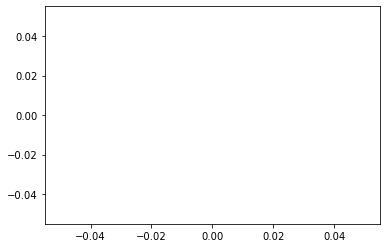

In [145]:
plt.plot(sc)


In [146]:
tr_acc=[]
for i in df1_list:
    tr_acc.append(i.score(x1,y1))
    

In [147]:
tes_score=[i.score(x_te,y_te) for i in df1_list]

In [148]:
tr_acc

[1.0,
 0.999,
 0.998,
 0.996,
 0.996,
 0.995,
 0.995,
 0.994,
 0.992,
 0.99,
 0.991,
 0.991,
 0.987,
 0.99,
 0.985,
 0.983,
 0.984,
 0.981,
 0.982,
 0.981,
 0.979,
 0.969,
 0.969,
 0.969,
 0.969,
 0.968,
 0.968,
 0.969,
 0.969,
 0.969,
 0.968,
 0.968,
 0.969,
 0.962,
 0.952,
 0.951,
 0.952,
 0.952,
 0.951,
 0.952,
 0.951,
 0.951,
 0.952,
 0.953,
 0.953,
 0.95,
 0.951,
 0.938,
 0.939,
 0.94,
 0.938,
 0.941,
 0.939,
 0.938,
 0.939,
 0.94,
 0.935,
 0.935,
 0.933,
 0.932,
 0.933,
 0.928,
 0.929,
 0.923,
 0.925,
 0.925,
 0.923,
 0.923,
 0.918,
 0.907,
 0.907,
 0.907,
 0.905,
 0.906,
 0.905,
 0.908,
 0.905,
 0.906,
 0.899,
 0.901,
 0.902,
 0.895,
 0.892,
 0.892,
 0.891,
 0.891,
 0.886,
 0.884,
 0.878,
 0.875,
 0.883,
 0.879,
 0.878,
 0.879,
 0.877,
 0.865,
 0.867,
 0.873,
 0.867,
 0.863,
 0.857,
 0.859,
 0.855,
 0.849,
 0.851,
 0.85,
 0.846,
 0.841,
 0.822,
 0.829,
 0.818,
 0.825,
 0.82,
 0.811,
 0.812,
 0.806,
 0.806,
 0.804,
 0.798,
 0.796,
 0.795,
 0.794,
 0.792,
 0.789,
 0.785,
 0.785,
 

In [149]:
tes_score

[0.765625,
 0.765625,
 0.7625,
 0.753125,
 0.765625,
 0.76875,
 0.76875,
 0.759375,
 0.7625,
 0.759375,
 0.7625,
 0.746875,
 0.76875,
 0.75625,
 0.7625,
 0.765625,
 0.75625,
 0.759375,
 0.75625,
 0.746875,
 0.759375,
 0.765625,
 0.753125,
 0.75625,
 0.7375,
 0.746875,
 0.7375,
 0.75,
 0.740625,
 0.746875,
 0.746875,
 0.759375,
 0.759375,
 0.753125,
 0.75,
 0.75,
 0.746875,
 0.74375,
 0.75,
 0.74375,
 0.75,
 0.746875,
 0.74375,
 0.75,
 0.746875,
 0.74375,
 0.7375,
 0.7375,
 0.753125,
 0.746875,
 0.740625,
 0.740625,
 0.734375,
 0.75,
 0.746875,
 0.74375,
 0.75,
 0.740625,
 0.753125,
 0.7375,
 0.74375,
 0.7375,
 0.7375,
 0.7375,
 0.7375,
 0.728125,
 0.7375,
 0.74375,
 0.734375,
 0.728125,
 0.725,
 0.728125,
 0.734375,
 0.734375,
 0.73125,
 0.7375,
 0.740625,
 0.728125,
 0.71875,
 0.721875,
 0.73125,
 0.721875,
 0.73125,
 0.715625,
 0.7125,
 0.721875,
 0.7125,
 0.725,
 0.715625,
 0.7125,
 0.721875,
 0.7125,
 0.696875,
 0.7,
 0.696875,
 0.696875,
 0.69375,
 0.69375,
 0.7,
 0.69375,
 0.6968

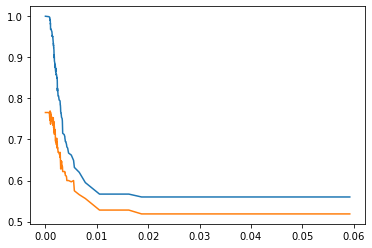

In [150]:
fig,ax=plt.subplots()
ax.plot(ccpp,tr_acc)
ax.plot(ccpp,tes_score)

In [159]:
dt1_model2=DecisionTreeClassifier(ccp_alpha=0.014,random_state=442)
dt1_model2.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=442)

In [160]:
dt1_model2.score(x1,y1)

0.567

In [162]:
dt1_model2.score(x_te,y_te)

0.528125

[Text(279.0, 453.0, 'X[10] <= 9.85\ngini = 0.633\nsamples = 1000\nvalue = [5, 32, 468, 364, 121, 10]'),
 Text(139.5, 271.8, 'X[6] <= 60.5\ngini = 0.467\nsamples = 478\nvalue = [2, 16, 324, 128, 7, 1]'),
 Text(69.75, 90.59999999999997, 'gini = 0.54\nsamples = 302\nvalue = [2, 10, 173, 109, 7, 1]'),
 Text(209.25, 90.59999999999997, 'gini = 0.251\nsamples = 176\nvalue = [0, 6, 151, 19, 0, 0]'),
 Text(418.5, 271.8, 'X[10] <= 11.55\ngini = 0.671\nsamples = 522\nvalue = [3, 16, 144, 236, 114, 9]'),
 Text(348.75, 90.59999999999997, 'gini = 0.645\nsamples = 401\nvalue = [3, 15, 138, 186, 57, 2]'),
 Text(488.25, 90.59999999999997, 'gini = 0.601\nsamples = 121\nvalue = [0, 1, 6, 50, 57, 7]')]

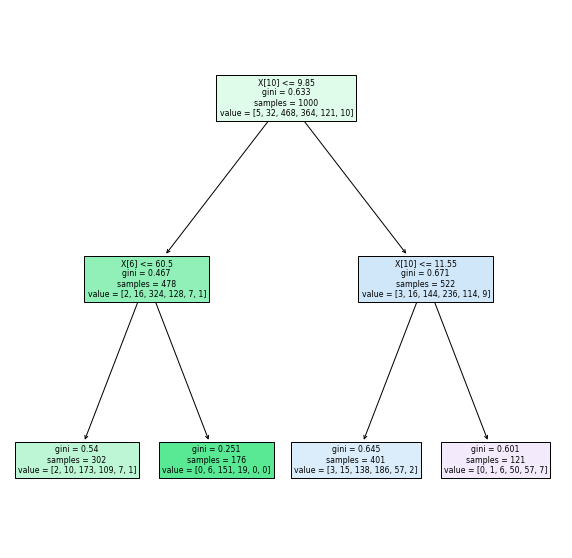

In [163]:
plt.figure(figsize=(10,10))
tree.plot_tree(dt1_model2,filled=True)

In [ ]:
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

In [174]:
grid_param = {
    "criterion":['gini','entropy'],
    "splitter":['best','random'],
    "max_depth":range(2,40,1),
    "min_samples_split":range(2,40,1),
     "min_samples_leaf":range(1,10,1)
    
}

In [175]:
res=GridSearchCV(DecisionTreeClassifier(),param_grid=grid_param,cv=5,n_jobs=-1)

In [176]:
res.fit(x1,y1)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 40),
                         'splitter': ['best', 'random']})

In [177]:
res.best_params_

{'criterion': 'entropy',
 'max_depth': 4,
 'min_samples_leaf': 7,
 'min_samples_split': 25,
 'splitter': 'random'}

In [179]:
res22=DecisionTreeClassifier(criterion= 'entropy',
 max_depth= 4,
 min_samples_leaf= 7,
 min_samples_split= 25,
 splitter= 'random')

In [180]:
res22.fit(x1,y1)

DecisionTreeClassifier(criterion='entropy', max_depth=4, min_samples_leaf=7,
                       min_samples_split=25, splitter='random')

In [182]:
res22.score(x1,y1)

0.568

In [183]:
res22.score(x_te,y_te)

0.5375